**Diplomatura en Ciencia de Datos, Aprendizaje Automático y sus Aplicaciones**

**Edición 2022**

## **Mentoría: Data Science aplicado a BCI**

---
## **Trabajo Práctico 2**
## Continuación Análisis y Visualización y Curación de Datos
## Dominio de Frecuencia
---

## **Grupo 2**

**Integrantes:** Gastón Briozzo, Pablo Ventura

**Profesor de Práctico:** Juan Manuel Lopez


# Importación de librerias

In [1]:
import io
import matplotlib
import matplotlib.pyplot as plt
import seaborn
import itertools
import os
import numpy as np
import pandas as pd
import scipy
#import pyforest
import pathlib
from csv import reader
from scipy import signal
from scipy.signal import spectrogram
from pathlib import Path
from scipy import signal as sgn
#seaborn.set_context('talk')


In [2]:
#confguracion para la resolucion de los graficos
#seaborn.set(rc={"figure.dpi":200, 'savefig.dpi':300})

In [3]:
!git clone https://github.com/pablogventura/bci_2.git
!mv bci_2/Database/* .
!mv "JA 1 - 2020 - 11-19.txt" "JA 1 - 2020-11-19.txt"

Clonando en 'bci_2'...
remote: Enumerating objects: 15, done.
remote: Counting objects: 100% (15/15), done.
remote: Compressing objects: 100% (14/14), done.
remote: Total 15 (delta 0), reused 15 (delta 0), pack-reused 0
Recibiendo objetos: 100% (15/15), 13.49 MiB | 5.49 MiB/s, listo.


In [4]:
# Útil

def has_metadata(csv_path):
    f = open(csv_path, newline='')
    csv_reader = reader(f)
    return True if next(csv_reader)[0] == '%OpenBCI Raw EEG Data' else False


def raw_read_bci_csv(csv_path):
    csv_reader = reader(open(csv_path, newline=''))
    n_lines = 10 if next(csv_reader)[0] == '%OpenBCI Raw EEG Data' else 0
    column_names = [
        'sample_index', 'ch0', 'ch1', 'ch2', 'ch3', 'acc0',
        'acc1', 'acc2', 'label', 'provided_time', 'timestamp'
    ]
    dataset = pd.read_csv(csv_path, skiprows=n_lines, index_col=False, names=column_names)
    sample_rate = 200.
    dataset['time'] = dataset.index.values/sample_rate
    return dataset


def clean_read_bci_csv(csv_path):
    dataset = raw_read_bci_csv(csv_path)
    dataset.drop(columns=['sample_index', 'acc0', 'acc1', 'acc2', 'provided_time', 'timestamp'], inplace=True)
    return dataset


def add_sub_label(dataset):
    labels = dataset.label.unique().tolist()
    for label in labels:
        sample_idx = dataset.loc[dataset.label == label].index.values
        gap_btn_idx = sample_idx[1:] - sample_idx[:-1]
        selected_idx = np.insert((gap_btn_idx != 1), 0, True)
        desired_idx_bottom = sample_idx[selected_idx]
        selected_idx = np.append(selected_idx[1:], True)
        desired_idx_top = sample_idx[selected_idx]
        for k, (start, stop) in enumerate(zip(desired_idx_bottom, desired_idx_top)):
            selection = (dataset.index.values >= start) & (dataset.index.values <= stop)
            dataset.loc[selection, 'sub_label'] = f'{label}-{k}'
    return dataset


def detrend_channels(dataset, mode='both', window=200):
    if mode in ['global', 'both']:
        detrend_global = dataset.copy()
    if mode in ['both', 'local']:
        detrend_local = dataset.copy()
    for subject in dataset.subject.unique():
        selection = (dataset.subject == subject)
        for session in dataset.loc[selection, 'session'].unique():
            selection2 = selection & (dataset.session == session)
            if mode in ['global', 'both']:
                for ch in ['ch0', 'ch1', 'ch2', 'ch3']:
                    y = dataset.loc[selection2, ch].values
                    detrend_global.loc[selection2, ch] = signal.detrend(y)
            if mode in ['both', 'local']:
                for ch in ['ch0', 'ch1', 'ch2', 'ch3']:
                    index = dataset.loc[selection2].index.tolist()
                    iters = [iter(index)] * window
                    for k, index_set in enumerate(itertools.zip_longest(*iters)):
                        if None in index_set:
                            index_set = list(filter(None, index_set))
                        selection3 = selection2 & dataset.index.isin(index_set)
                        y = dataset.loc[selection3, ch].values
                        detrend_local.loc[selection3, ch] = signal.detrend(y)
    if mode == 'global':
        return detrend_global
    if mode == 'local':
        return detrend_local
    else:
        return detrend_global, detrend_local


def read_all_datasets(csvs_path: Path):
    complete_dataset = pd.DataFrame()
    for csv_path in csvs_path.iterdir():
        dataset = clean_read_bci_csv(csv_path)
        dataset = add_sub_label(dataset)
        dataset['subject'] = csv_path.name[:2]
        dataset['session'] = csv_path.name[3]
        dataset['sub_sess'] = dataset.subject + '-' + dataset.session
        complete_dataset = pd.concat([complete_dataset, dataset])
    return complete_dataset

In [5]:
df_AA0 = clean_read_bci_csv('AA 0 - 2020-10-28.csv')
df_AA1 = clean_read_bci_csv('AA 1 - 2020-11-24.txt')
df_AA2 = clean_read_bci_csv('AA 2 - 2020-11-24.txt')
df_HA1 = clean_read_bci_csv('HA 1 - 2020-11-24.txt')
df_JA1 = clean_read_bci_csv('JA 1 - 2020-11-19.txt')
df_JA2 = clean_read_bci_csv('JA 2 - 2020-11-24.txt')
df_MA1 = clean_read_bci_csv('MA 1 - 2020-12-18.txt')

df_AA0

,ch0,ch1,ch2,ch3,label,time
0,-1.86,-12.95,-9.18,-41.36,99,0.000
1,10.77,3.47,6.87,-15.13,99,0.005
2,87.61,65.61,88.78,32.23,99,0.010
3,83.04,50.88,77.30,4.49,99,0.015
4,8.07,-20.55,-6.68,-38.09,99,0.020
...,...,...,...,...,...,...
45968,-15.69,-22.97,3.24,-75.01,99,229.840
45969,84.95,73.30,116.55,-5.97,99,229.845
45970,73.14,47.58,95.13,-36.34,99,229.850
45971,3.68,-20.26,13.70,-89.01,99,229.855


# A) Nivel Segmento/Estado: Seleccione los datos correspondientes a un paciente y un canal, y para él defina un conjunto de datos para cada estado presente en el dataset. Para cada uno de ellos estudie los siguientes elementos y luego compárelos.

In [6]:
def label_time(dataframe,label):
  result = dataframe[dataframe.label==label]
  result = result.drop(['time'], axis=1)
  result = result.copy()
  result = result.reset_index()
  result['time'] = result.index.values/200
  return result

## A) a) A partir de la frecuencia de muestreo previamente determinada y usando el teorema de Nyquist ($f_{NQ} = f_0/2$). ¿Qué frecuencia máxima pudo ser registrada en los datos disponibles?

La frecuencia de muestreo experimental es $f_0 = 200 Hz$. Esto significa que si los instrumentos registran una señal periódica cuya frecuenca es de $200 Hz$, mediran un valor constante, por lo que esta no será interpretada corectamente.

El Teorema de Nyquist nos dice que la mayor freuencia de entrada interpretable por un intrumento con frecuencia de medición $f_0$ esta dada por $f_{NQ} = f_0/2$.

De esta forma, la mayor frecuencia registrable en este experimento es de $f_{NQ} = 200/2 Hz = 100 Hz$.

## A) b) Compute y grafique la densidad espectral de potencia para cada segmento. Elija las escalas apropiadas para su visualización (qué magnitudes están graficando? corresponde el uso de decibeles?).

In [7]:
def fft(df,ch, estado):
  df = label_time(df, estado)
  s = df[ch].to_numpy()
  t = df.time.to_numpy()

  s = s - np.mean(s) # elimina ruido
  s_f = np.fft.rfft(s)
  #Luego calculamos la densidad espectral utilizando la fórmula presentada en el link de información

  dt = 1/200 #podríamos usar 0.001 que definimos previamente
  T = t[-1] #podríamos usar el segundo 1 que mencionamos previamente
  S_xx = ((2*dt**2)/T)*s_f*s_f.conj()
  S_xx = S_xx.real
  freqs = np.fft.rfftfreq(n=t.shape[0], d=dt)
  return (S_xx,freqs)

/home/pablo/.local/lib/python3.10/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/pablo/.local/lib/python3.10/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/pablo/.local/lib/python3.10/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


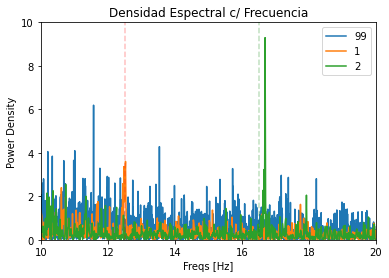

In [8]:
for e in [99,1,2]:
  S_xx, freqs = fft(df_MA1,"ch3",e)
  ax = seaborn.lineplot(freqs,S_xx, label=e)
  ax.set_xlabel("Freqs [Hz]")
  ax.set_ylabel("Power Density")
  ax.set_title("Densidad Espectral c/ Frecuencia")
  ax.set_xlim((10,20))
  ax.set_ylim((0,10))
ax.axvline(12.5, color='r', linestyle='--',alpha=0.25, label="12.5Hz")
ax.axvline(16.5, color='g', linestyle='--',alpha=0.25, label="16.5Hz")

/home/pablo/.local/lib/python3.10/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


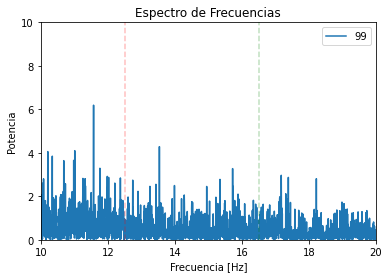

In [9]:

e = 99
S_xx, freqs = fft(df_MA1,"ch3",e)
ax = seaborn.lineplot(freqs,S_xx, label=e)
ax.set_xlabel("Frecuencia [Hz]")
ax.set_ylabel("Potencia")
ax.set_title("Espectro de Frecuencias")
ax.set_xlim((10,20))
ax.set_ylim((0,10))
ax.axvline(12.5, color='r', linestyle='--',alpha=0.25, label="12.5Hz")
ax.axvline(16.5, color='g', linestyle='--',alpha=0.25, label="16.5Hz")

/home/pablo/.local/lib/python3.10/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


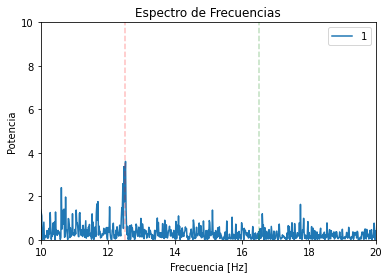

In [10]:
e = 1
S_xx, freqs = fft(df_MA1,"ch3",e)
ax = seaborn.lineplot(freqs,S_xx, label=e)
ax.set_xlabel("Frecuencia [Hz]")
ax.set_ylabel("Potencia")
ax.set_title("Espectro de Frecuencias")
ax.set_xlim((10,20))
ax.set_ylim((0,10))
ax.axvline(12.5, color='r', linestyle='--',alpha=0.25, label="12.5Hz")
ax.axvline(16.5, color='g', linestyle='--',alpha=0.25, label="16.5Hz")

/home/pablo/.local/lib/python3.10/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


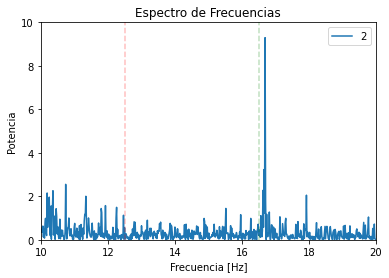

In [11]:
e = 2
S_xx, freqs = fft(df_MA1,"ch3",e)
ax = seaborn.lineplot(freqs,S_xx, label=e)
ax.set_xlabel("Frecuencia [Hz]")
ax.set_ylabel("Potencia")
ax.set_title("Espectro de Frecuencias")
ax.set_xlim((10,20))
ax.set_ylim((0,10))
ax.axvline(12.5, color='r', linestyle='--',alpha=0.25, label="12.5Hz")
ax.axvline(16.5, color='g', linestyle='--',alpha=0.25, label="16.5Hz")

## A) c) Determine la/las frecuencias con mayor presencia en cada caso. ¿Qué puede concluir con esta nueva información? ¿Encuentra diferencias en este aspecto entre los tramos 99 y los tramos 1-2? ¿Hay frecuencias no asociadas con el fenómeno a detectar?

En cada caso, las frecuencias con mayor presencia se corresponden con las frecuencias de estimulación a la que se encuentra sometido el paciente. Esto es, 12.5 y 16.5 Hz para los estados 1 y 2 respectivamente. Por su parte, para el estado 99 no vemos ninguna frecuencia predominante, mostrando un espectro que se corresponde con ruido.
        
Las contribuciones de las demás frecuencias son claramente distinguibles del pico central correspondiente al estado de estimulación.

## A) d) ¿Es útil el concepto de outliers o conviene usar otros criterios? ¿Se pueden descartar señales?


Al considerar la tranformada de fourier, la información relevante se corresponde a la posición central del pico, es decir, la frecuencia principal. Por este motivo, el concepto de outlier deja de ser útil.

Podemos descartar el estado 99, correspondiente al paciente sin ser estimulado. Esta señal no presenta un pico central, sino una distribución aleatoria de ruido.

In [12]:
print(df_MA1.time)
#ax = seaborn.lineplot(df_MA1.time,df_MA1.ch1)

sig_np=[df_MA1.time,df_MA1.ch1]

sf = 200 #Frecuencia de muestreo
f_nq = sf/2 #Para crear el filtro debemos pasar la frecuencia a la que queremos filtrar (frecuencia crítica) divido la frecuencia de Nyquist
order = 4 #Podemos entrar en mayor detalle luego, pero el orden de un filtro es básicamente cuan "fuerte" el mismo se aplica

b, a = sgn.iirfilter(N=order, Wn=10/f_nq, btype="highpass", ftype="butter") #Existen muchos otros parámetros que se pueden configurar en el filtro, que pueden buscar y estudiar en la documentación.

#Habiendo creado el filtro, lo aplicamos con la función filtfilt

sig_filt = sgn.filtfilt(b, a, sig_np, axis=-1)

print(sig_filt)

0          0.000
1          0.005
2          0.010
3          0.015
4          0.020
          ...   
69705    348.525
69706    348.530
69707    348.535
69708    348.540
69709    348.545
Name: time, Length: 69710, dtype: float64
[[-4.64289229e-04 -5.07893870e-04 -4.96497964e-04 ... -1.96638978e-12
  -6.94095757e-13  6.95819591e-13]
 [-4.03790294e-01  4.52895108e-01  2.07664456e+01 ... -2.70163072e+00
   1.48733232e+00 -3.84879232e-01]]


In [13]:
from scipy import signal as sgn

#Si queremos aplicar un filtro Butterworth pasa alto que solo conserve las frecuencias por encima de los 10 Hz
#Primero debemos crearlo con la función iirfilter, este crea dos valores a y b que representan a ESE filtro específicamente

sf = 200 #Frecuencia de muestreo
f_nq = sf/2 #Para crear el filtro debemos pasar la frecuencia a la que queremos filtrar (frecuencia crítica) divido la frecuencia de Nyquist
order = 4 #Podemos entrar en mayor detalle luego, pero el orden de un filtro es básicamente cuan "fuerte" el mismo se aplica

b, a = sgn.iirfilter(N=order, Wn=10/f_nq, btype="highpass", ftype="butter") #Existen muchos otros parámetros que se pueden configurar en el filtro, que pueden buscar y estudiar en la documentación.

#Habiendo creado el filtro, lo aplicamos con la función filtfilt

sig_filt = sgn.filtfilt(b, a, sig_np, axis=-1)

## A) e) Comparar en el dominio del tiempo las señales con y sin filtrado de frecuencias indeseadas. ¿Qué diferencias encuentra?

In [14]:
def plot_spectral(signal, freq_lim=None, amp_lim=None, title=None):
    dt = 1/200

    N = signal.shape[0]
    T = N*dt
    
    fft = np.fft.rfft(signal)
    Sxx = ((2*dt**2)/T)*fft*fft.conj()
    
    freqs = np.fft.rfftfreq(n=N, d=dt)
    
    fig, axs = plt.subplots(1,1)
    fig.set_figwidth(10)
    
    axs.plot(freqs, Sxx)
    axs.set_ylabel("Spectral Density [$uV^2$/Hz]")
    axs.set_xlabel("Freq [Hz]")
    if title:
      axs.set_title(f"Frequency Spectrum of Signal {title}")
    else:
      axs.set_title("Frequency Spectrum of Signal")
    axs.axvline(12.5, color='r', linestyle='--',alpha=0.75, label="12.5Hz")
    axs.axvline(16.5, color='g', linestyle='--',alpha=0.75, label="16.5Hz")
    axs.set_xlim(freq_lim)
    axs.set_ylim(amp_lim)

In [15]:
def filter_freq(sig, show=False, title=None):

  #Empezemos con un plot que muestre la señal original en la etiqueta 1
  #plot_spectral(sig)#sig_np[canal, :])

  #Creemos y apliquemos primero el filtro Notch, este requiere otros parámetros (los cuáles pueden invesstigar en la docmentación)
  #de los cuales usaremos

  sf = 200 #Frecuencia de muestreo
  # Q=30 #calidad del filtro, es equivalente a determinar el orden del filtro Butter, indica cuán fuerte se filtra
  # f_notch = 50

  # b_notch, a_notch = sgn.iirnotch(w0=f_notch, Q=Q, fs=sf)
  # sig_notch = sgn.filtfilt(b_notch, a_notch, sig)#sig_np)
  #Hagamos un primer ploteo a ver como queda, pero sin limitar el eje x
  #plot_spectral(sig_notch)

  #Ahora creamos el filtro pasabanda Butterworth
  f_nq = sf/2
  f_low = 10
  f_high = 19
  order = 4

  b_band, a_band = sgn.iirfilter(N=order, Wn=[f_low/f_nq, f_high/f_nq], btype="bandpass", ftype="butter")
  sig_filt = sgn.filtfilt(b_band, a_band, sig)

  #veamos ahora la señal final
  if show:
    plot_spectral(sig_filt, title=title)
  return sig_filt

/usr/lib/python3/dist-packages/matplotlib/cbook/__init__.py:1298: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


array([-0.30647117,  7.07229834, 12.6172245 , ..., 18.51428226,
       10.19701118,  0.28206516])

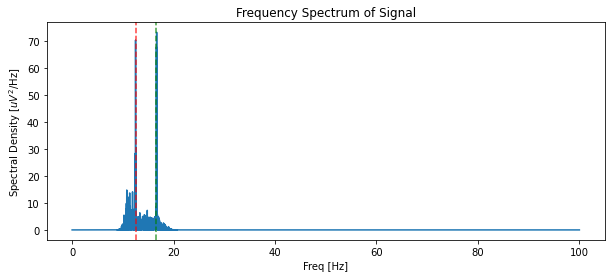

In [16]:
filter_freq(df_AA0.ch2, show=True)#[["ch0","ch1","ch2","ch3"]].to_numpy().T

In [17]:
def espectrograma(sig, title=None):
  Fs = 200
  interval = int(Fs)
  overlap = int(Fs * 0.95)
  f, t, Sxx = spectrogram(
      sig,
      fs=Fs,
      nperseg=interval,
      noverlap=overlap)

  fig, (ax0, ax1) = plt.subplots(2,1, gridspec_kw={'height_ratios': [5, 1]}, figsize=(12,5))
  if title:
    fig.suptitle(title)
  ax0.pcolormesh(t, f,Sxx, cmap='viridis', vmax=10, shading='gouraud')
  ax0.set_ylim([5, 20])
  ax0.set_ylabel('Frequency [Hz]')
  ax0.axhline(12.5, c='r', ls='-.', alpha=0.8)
  ax0.axhline(16.5, c='r', ls='-.', alpha=0.8)

  cmap = plt.get_cmap('tab10')
  ax1.plot(df_AA0.time.values, df_AA0.label.replace(99,0).values)
  ax1.set_xlim([0,df_AA0.time.max()])
  ax1.set_xlabel('Time [s]')
  seaborn.despine()
  plt.show()

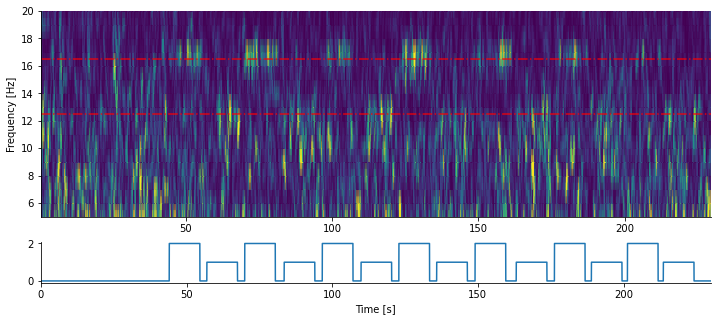

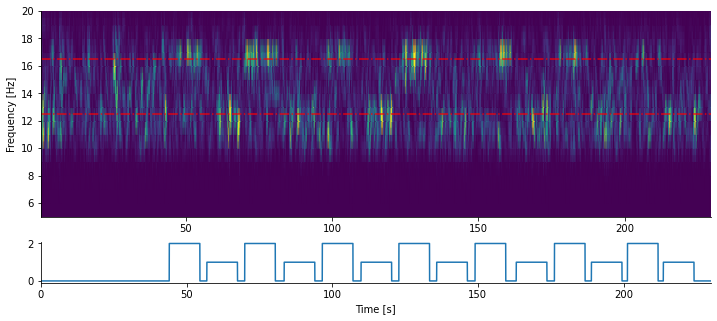

In [18]:
espectrograma(df_AA0.ch2)
espectrograma(filter_freq(df_AA0.ch2))

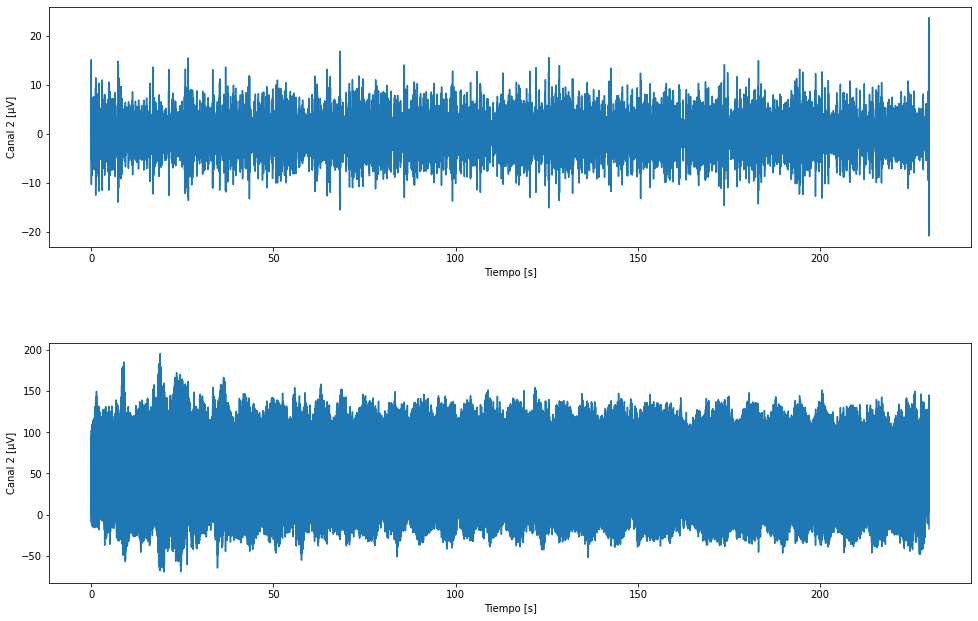

In [19]:
fig, axes = plt.subplots(nrows=2, figsize=(16, 10))

fig = seaborn.lineplot(x=df_AA0.time, y = filter_freq(df_AA0.ch2),ax=axes[0])
fig.set_xlabel("Tiempo [s]")
fig.set_ylabel(f"Canal 2 [µV]")
fig = seaborn.lineplot(x=df_AA0.time, y = df_AA0.ch2,ax=axes[1])
fig.set_xlabel("Tiempo [s]")
fig.set_ylabel(f"Canal 2 [µV]")
plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.4, 
                    hspace=0.4)



La diferencia fundamental es que en la señal filtrada no se ve valor central ni deriva.

# B) Nivel Paciente - un canal: Seleccione los datos correspondientes a un paciente y un canal de adquisición y para ese caso estudie los siguientes elementos:

## B) a) Para cada intervalo de adquisición de cada estado, determine la frecuencia de mayor presencia relevante al problema estudiado. Ej: Un canal tiene 10 intervalos 2, para cada uno de ellos la frecuencia máxima oscila alrededor de 12.5.

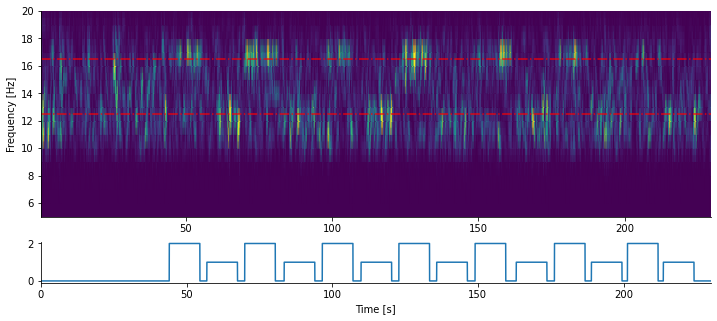

In [20]:
#12.5
#16.5


espectrograma(filter_freq(df_AA0.ch2))

In [21]:
def ind_seg(df):
  ind_1 = []
  ind_2 = []
  for i in range(len(df)-1):
    lab_old = df.label[i]
    lab_new = df.label[i+1]
    if lab_old!=1 and lab_new==1:
      i_1 = i+1
    if lab_old==1 and lab_new!=1:
      f_1 = i+1
      ind_1 += [[i_1,f_1]]
    if lab_old!=2 and lab_new==2:
      i_2 = i+1
    if lab_old==2 and lab_new!=2:
      f_2 = i+1
      ind_2 += [[i_2,f_2]]
  return ind_1, ind_2

In [22]:
ind_1, ind_2 = ind_seg(df_AA0)
print(ind_1)
print(ind_2)

[[11387, 13490], [16696, 18800], [21974, 24074], [27166, 29272], [32629, 34735], [37789, 39889], [42727, 44834]]
[[8806, 10909], [13988, 16087], [19313, 21419], [24571, 26677], [29803, 31907], [35252, 37354], [40265, 42367]]


In [23]:
print(ind_1[0][1])
df_AA0.label[ind_2[0][0]:ind_2[0][1]].describe()

13490


count    2103.0
mean        2.0
std         0.0
min         2.0
25%         2.0
50%         2.0
75%         2.0
max         2.0
Name: label, dtype: float64

In [24]:
def f_max(df):
  s = df.to_numpy()
  t = df.time.to_numpy()

  s = s - np.mean(s) # elimina ruido
  s_f = np.fft.rfft(s)
  #Luego calculamos la densidad espectral utilizando la fórmula presentada en el link de información

  dt = 1/200 #podríamos usar 0.001 que definimos previamente
  T = t[-1] #podríamos usar el segundo 1 que mencionamos previamente
  S_xx = ((2*dt**2)/T)*s_f*s_f.conj()
  S_xx = S_xx.real
  freqs = np.fft.rfftfreq(n=t.shape[0], d=dt)
  fmax = freqs[S_xx.argmax()]
  freqs[:] = fmax
  return (t,freqs)

In [25]:
def filtred_fft(df,ch, estado):
  df = label_time(df, estado)
  s = df[ch].to_numpy()
  t = df.time.to_numpy()

  s = s - np.mean(s) # elimina ruido
  s = filter_freq(s) # filtramos las frecuencias
  s_f = np.fft.rfft(s)
  #Luego calculamos la densidad espectral utilizando la fórmula presentada en el link de información

  dt = 1/200 #podríamos usar 0.001 que definimos previamente
  T = t[-1] #podríamos usar el segundo 1 que mencionamos previamente
  S_xx = ((2*dt**2)/T)*s_f*s_f.conj()
  S_xx = S_xx.real
  freqs = np.fft.rfftfreq(n=t.shape[0], d=dt)
  return (S_xx,freqs)

/home/pablo/.local/lib/python3.10/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='time'>

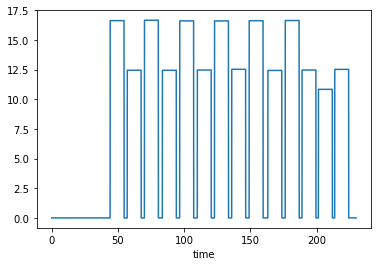

In [26]:
f_max = [0]*len(df_AA0)

for ind in ind_1:
  S_xx, freqs = filtred_fft(df_AA0[ind[0]:ind[1]],"ch2",1)
  fmax = freqs[S_xx.argmax()]
  for i in range(ind[0],ind[1]):
    f_max[i] = fmax

for ind in ind_2:
  S_xx, freqs = filtred_fft(df_AA0[ind[0]:ind[1]],"ch2",2)
  fmax = freqs[S_xx.argmax()]
  for i in range(ind[0],ind[1]):
    f_max[i] = fmax

seaborn.lineplot(df_AA0.time,f_max)

## B) b) Realice un análisis estadístico de dichas frecuencias a lo largo de todo el conjunto de intervalos para cada clase. Determine su distribución y su resumen estadístico según considere apropiado. Ej: Siguiendo el ejemplo anterior, cómo es la distribución de esas frecuencias alrededor de 12.5 en el intervalo 2 y de la misma manera para los otros.

In [27]:
dataframes = [df_AA0, df_AA1, df_AA2, df_HA1, df_JA1, df_JA2, df_MA1]
dataframes_names = ["AA0", "AA1", "AA2", "HA1", "JA1", "JA2", "MA1"]
estados = [1, 2]
canales = ["ch0","ch1","ch2","ch3"]

In [28]:
f_max1 = []
f_max2 = []

for df in dataframes:
  for c in canales:
    
    ind_1, ind_2 = ind_seg(df)

    for ind in ind_1:
      S_xx, freqs = filtred_fft(df[ind[0]:ind[1]],c,1)
      fmax = freqs[S_xx.argmax()]
      for i in range(ind[0],ind[1]):
        f_max1.append(fmax)

    for ind in ind_2:
      S_xx, freqs = filtred_fft(df[ind[0]:ind[1]],c,2)
      fmax = freqs[S_xx.argmax()]
      for i in range(ind[0],ind[1]):
        f_max2.append(fmax)

<AxesSubplot:ylabel='Count'>

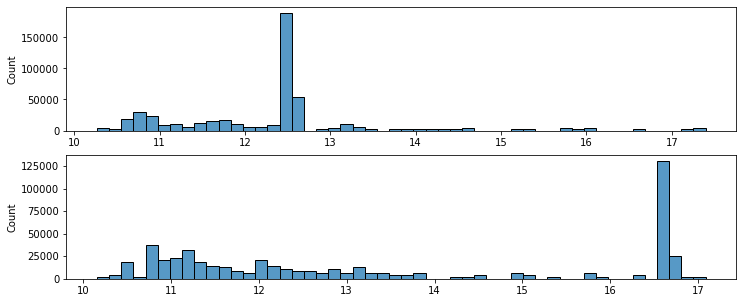

In [29]:
import numpy

fig, (ax0, ax1) = plt.subplots(2,1, figsize=(12,5))
seaborn.histplot(f_max1,ax=ax0,bins=50)
seaborn.histplot(f_max2,ax=ax1,bins=50)
#ax0.axvline(numpy.median(f_max1), c='r', ls='-.', alpha=0.8)
#ax1.axvline(numpy.median(f_max2), c='r', ls='-.', alpha=0.8)
#plt.show()

Vemos que, para cada estado, el histograma presenta un pico en la frecuencia correspondiente, mostrando un conteo sumamente superior al resto. En particula, para el estado 2, existe una gran cantidad de ruido en las frecuencias bajas, que aleja tanto a la media como a la mediana del valor esperado.

## B) c) Determine si existe una diferencia estadísticamente significativa, entre los valores centrales de frecuencias para los estados existentes.

In [30]:
m1 = numpy.array(f_max1).mean()
m2 = numpy.array(f_max2).mean()

s1 = numpy.array(f_max1).std()
s2 = numpy.array(f_max2).std()

estadistico = (m1-m2)/np.sqrt(s1*s1 + s2*s2)

estadistico

-0.42177749753845284

La diferencia entre las distribuciones es suficiente como para afirmar que son diferentes.

## B) d) ¿Son variables independientes el estado registrado de la señal y la frecuencia mayoritaria presente en el registro? Use herramientas cuantitativas y cualitativas para justificar su respuesta.

In [31]:
f_max = pd.Series(data=f_max)

f_max.corr(df_AA0.label)

-0.9663718901593813

El estado registrado de la señal y la frecuencia mayoritaria son variables claramente dependientes, como se puede ver en la correlacion.

## B) e) Compute y grafique el espectrograma del registro completo. Probar con el registro filtrado y sin filtrar y comentar las diferencias. Ver link informativo, si quedan dudas conceptuales no duden en preguntar.

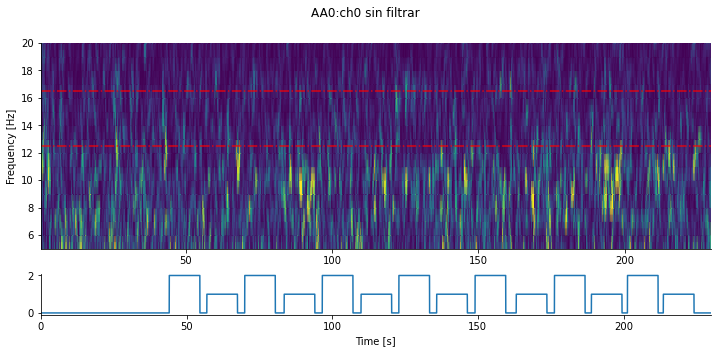

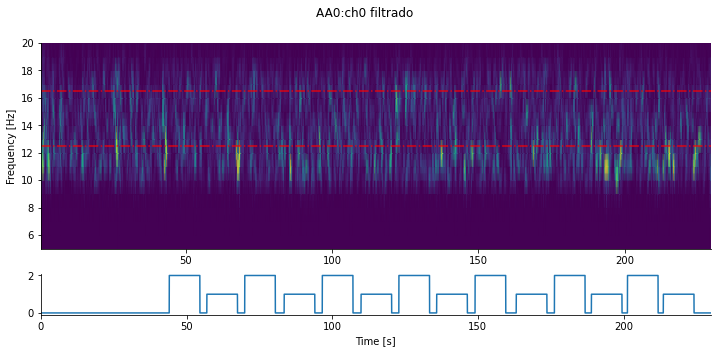

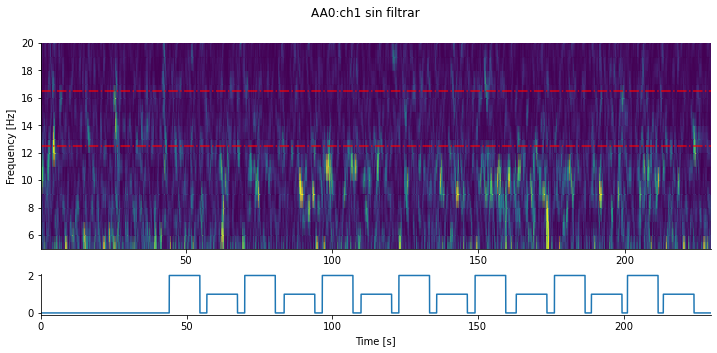

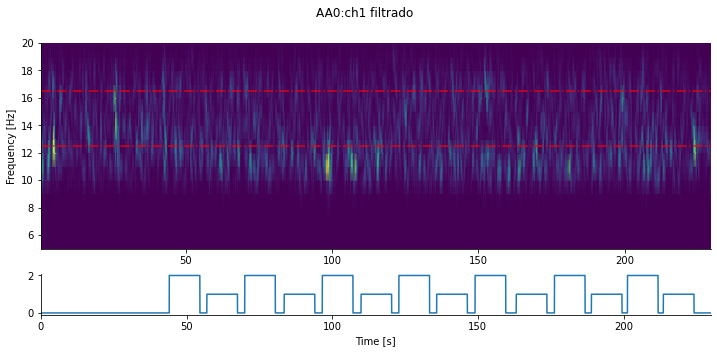

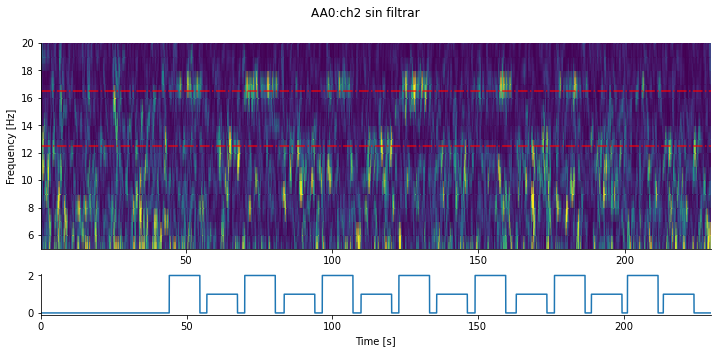

...

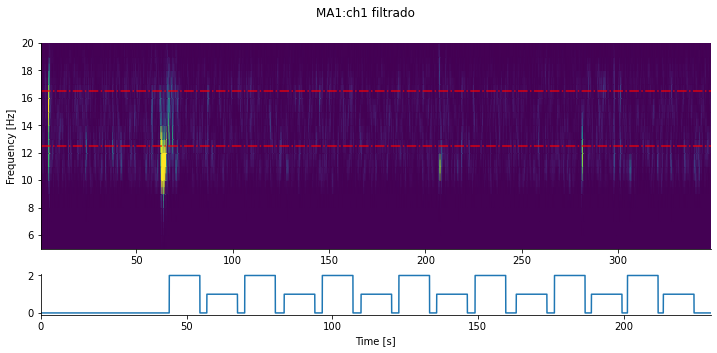

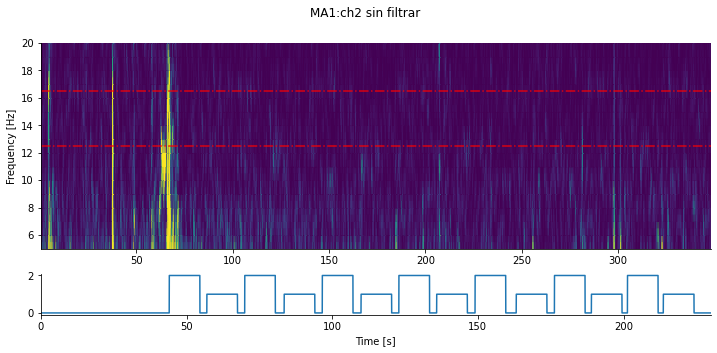

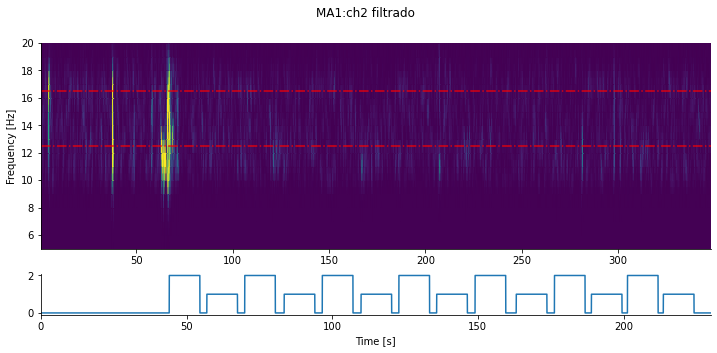

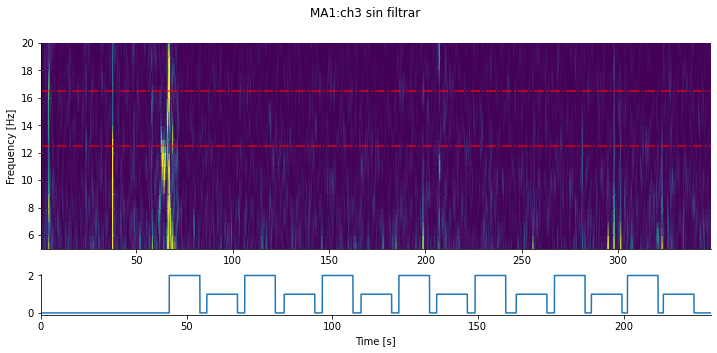

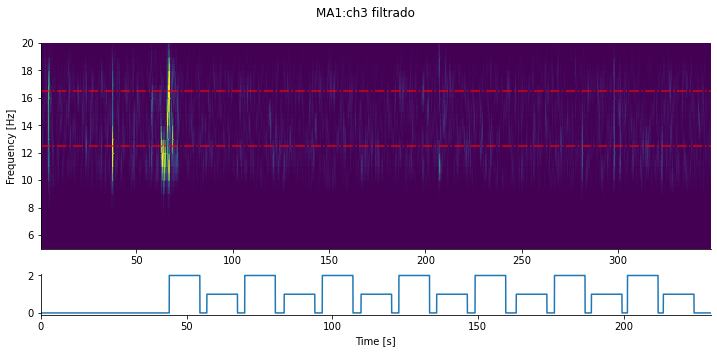

In [32]:
for i,df in enumerate(dataframes):
  df_name = dataframes_names[i]
  for ch in canales:
    espectrograma(df[ch], f"{df_name}:{ch} sin filtrar")
    espectrograma(filter_freq(df[ch]), f"{df_name}:{ch} filtrado")

## B) f) Resuma las principales conclusiones de este nivel de análisis.

A partir del estudio de las transformadas de Fourier de las señales originales observamos que:
- La frecuencia de mayor presencia coincide con la frecuencia de estimulacion a la que se expone al paciente. De esta forma se facilita el estudio, eliminando todos los posibles errores y fuentes de ruido en la señal original.
- Debido a las contribuciones de la red electrica y del background del ambiente que contaminan notablemente el espectro resultante, es convenciente realizar un filtrado por frecuencias para quedarnos con el intervalo de frecuencias relevante.

# C) Nivel Paciente - multi canal: Seleccione los datos correspondientes a un paciente y para ese caso estudie los siguientes elementos:

## C) a) Compute el espectrograma para cada canal, y compárelos. ¿A simple vista, existe alguna correlación?

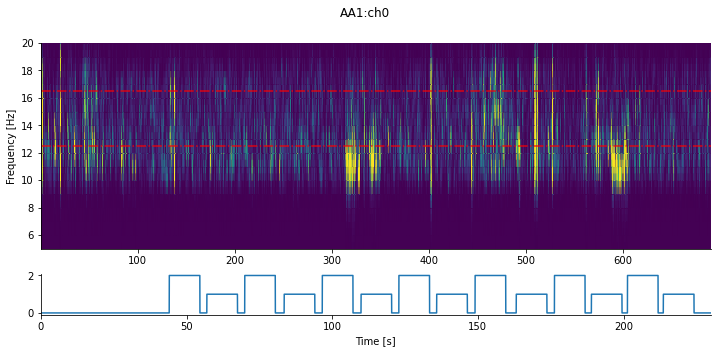

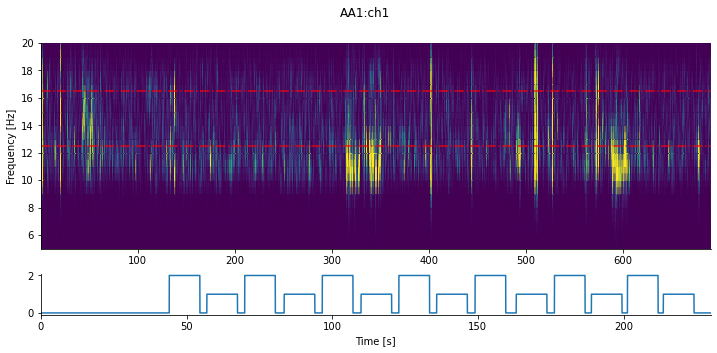

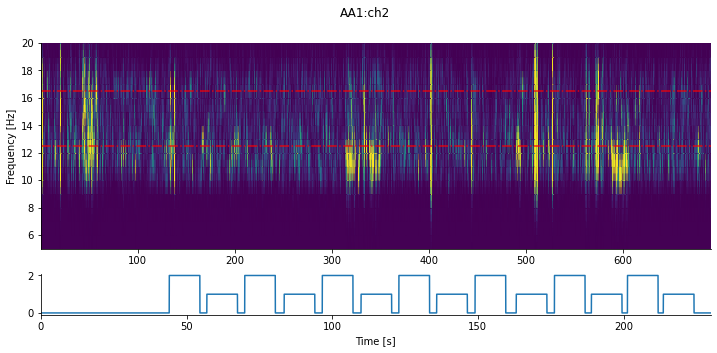

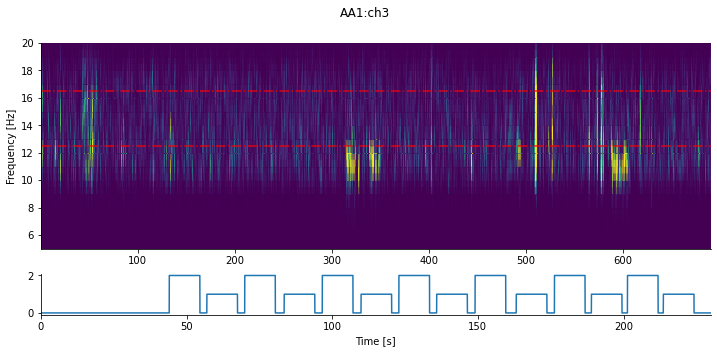

In [33]:
df = dataframes[1]
df_name = dataframes_names[1]
for ch in canales:
  espectrograma(filter_freq(df[ch]), f"{df_name}:{ch}")

Se nota correlacion a simple vista.

## C) b) A partir de la respuesta anterior. ¿Considera relevante trabajar con todos los canales disponibles o podría quedarse con un subconjunto?

A menos de que existiera algun error en el dataset, la eleccion del canal es irrelevante. Por lo que podemos realizar todo el analisis con solo uno de ellos.

## C) c) Resuma las principales conclusiones de este nivel de análisis.

Como los canales estan correlacionados, podemos realizar todo el analisis con solo uno de ellos.

# D) Nivel Multi-Paciente.

## D) a) A partir de las conclusiones extraídas de los niveles de análisis anteriores. Decida cuáles son los aspectos más importantes a analizar de los registros de un paciente y compárelos entre pacientes. ¿Encuentra diferencias significativas entre pacientes?

/usr/lib/python3/dist-packages/matplotlib/cbook/__init__.py:1298: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)
/usr/lib/python3/dist-packages/matplotlib/cbook/__init__.py:1298: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)
/usr/lib/python3/dist-packages/matplotlib/cbook/__init__.py:1298: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)
/usr/lib/python3/dist-packages/matplotlib/cbook/__init__.py:1298: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


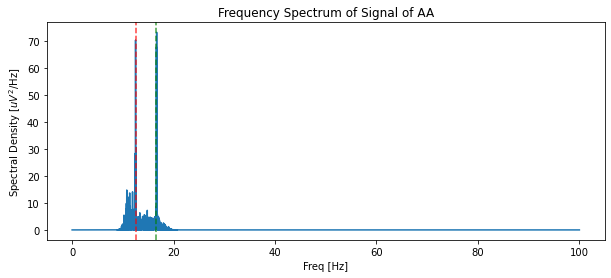

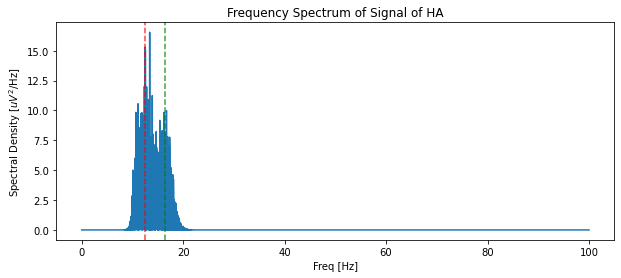

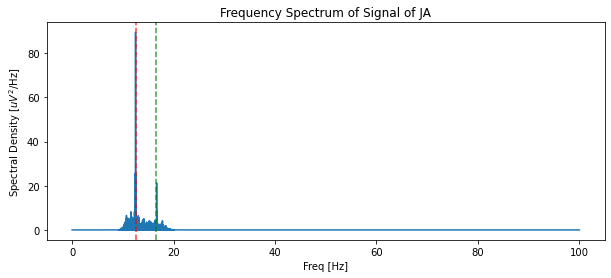

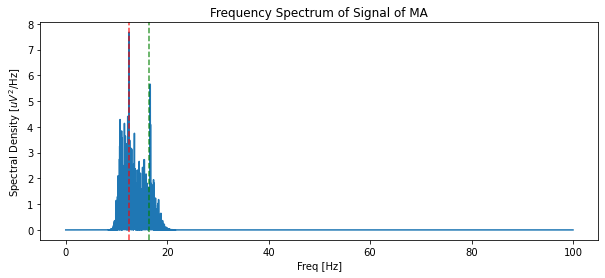

In [34]:
pacientes = [df_AA0, df_HA1, df_JA1, df_MA1]
pacientes_names = ["AA", "HA", "JA", "MA"]
for i,p in enumerate(pacientes):
  name = pacientes_names[i]
  filter_freq(p["ch2"], show=True, title=f"of {name}")

El aspecto mas importante para analizar de un paciente es la frecuencia de mayor presencia al hacer la transformada de Fourier sobre la señal original. Una vez analizado esto, existen diferencias entre los pacientes, pero no son relevantes al momento de realizar el analisis.

# E) Comparando con el Trabajo Práctico anterior.

## E) a) ¿Cambia la complejidad del análisis según el dominio en el que se estudien los datos?

El analisis de los datos a partir de la transformada de Fourier se simplifica considerablemente dado que solo necesitamos encontrar la frecuencia de mayor presencia para saber el estimulo al que esta siendo expuesto el paciente.

## E) b) Pensando en un problema de clasificación supervisada, ¿resulta más cómodo trabajar los datos en uno de los dos dominios?

Al momento de realizar una clasificacion supervisada, resulta mucho mas natural trabajar en el dominio de frecuencia, dado que esta es la naturaleza de las señales neuronales. En este dominio, la informacion a manejar es minima y los problemas se resuelven con mayor facilidad.